In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 50
VALIDATION_SPLIT = 0.1
ACTIVATION_FUNC = "tanh"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "rmsprop"
OUTLIER_CUTOFF = 98.0
NUM_CONV2D_LAYERS = 3
NUM_DENSE_LAYERS = 2
CONV2D_NEURONS = [32, 16, 16]
CONV2D_SIZE = ["(3, 3)", "(7, 7)", "(4, 4)"]
DENSE_LAYER_NEURONS = [64, 64]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 1  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (98.0 percentile): 9.62
Number of outliers (|value| > 28.86): 2
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


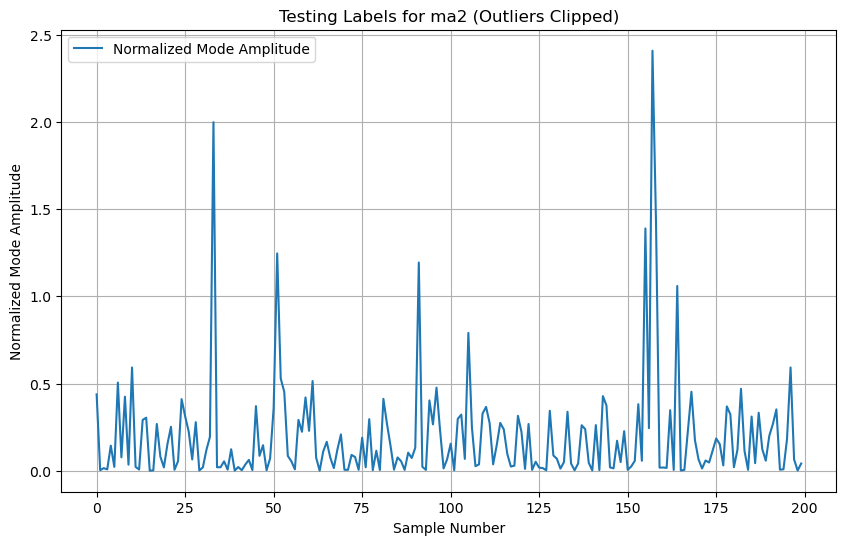

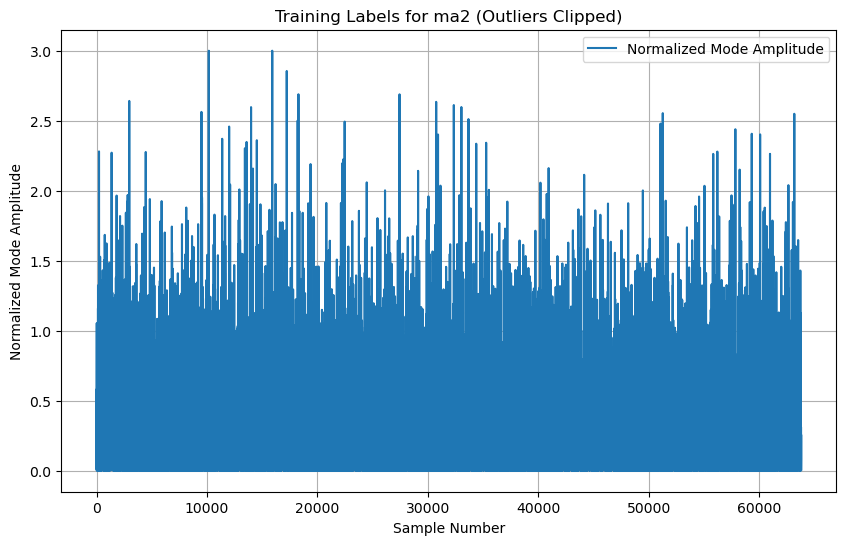

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 27, 27, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 21, 21, 16)     │        25,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 18, 18, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 15, 15, 16)     │         4,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 12, 12, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 181,281 (708.13 KB)

 Trainable params: 181,281 (708.13 KB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 8:48 295ms/step - loss: 0.1074

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 4.2378  

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 5.0780

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 4.7879

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 4.3952

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 4.0348

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 3.7242

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 3.4594

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 3.2322

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 3.0355

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 2.8638

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 2.7126

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 2.5790

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 2.4598

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 2.3527

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 2.2557

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 2.1674

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 2.0868

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 2.0129

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 1.9449

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 1.8821

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.8240

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.7699

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.7195

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.6723

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.6280

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.5864

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.5473

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.5103

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.4753

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 1.4423

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.4111

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.3814

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.3532

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.3263

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.3006

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.2761

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.2527

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.2303

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.2087

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.1881

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.1682

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.1492

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.1308

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.1131

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.0960

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.0850

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 1.0691

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 1.0537

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 1.0389

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 1.0246

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 1.0107

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9972

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9842

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9716

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9593

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9474

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9359

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9247

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9138

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.9033

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.8930

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.8830

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8733

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8638

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8545

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8455

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8367

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8281

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8198

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8116

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.8037

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7959

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7883

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7809

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7736

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7665

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7596

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7528

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7461

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7396

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7333

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7270

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7209

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.7149

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.7090

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.7032

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6976

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6921

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6866

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6813

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6760

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6709

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6658

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6609

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6560

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6512

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6465

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6419

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.6374

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.6329

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.6285

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.6242

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.6200

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.6158

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.6117

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.6077

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.6038

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5999

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5960

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5922

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5885

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5849

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5812

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5777

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5742

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.5708

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5674

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5640

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5607

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5575

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5542

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5511

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5480

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5449

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.5418

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.5389

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.5359

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.5330

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.5301

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.5273

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.5245

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.5217

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.5190

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.5163

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.5136

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.5110

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.5084

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.5059

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.5033

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.5008

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4984

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4960

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4936

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4912

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4888

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4865

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4842

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4820

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.4797

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4775

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4754

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4732

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4711

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4690

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4669

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4648

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4628

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4608

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4588

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4568

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4549

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4529

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4510

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.4491

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4473

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4454

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4436

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4418

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4400

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4383

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4365

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4348

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4331

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4314

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4297

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4280

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4264

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4247

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4231

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4215

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.4199

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4183

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4168

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4152

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4137

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4122

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4107

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4092

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4077

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4063

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4048

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4034

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4020

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.4006

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3992

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3978

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.3965

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3951

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3938

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3924

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3911

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3898

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3885

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3872

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3859

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3847

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3834

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3822

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3809

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3797

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3785

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3773

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.3761

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3749

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3737

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3726

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3714

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3703

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3691

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3680

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3669

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3658

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3647

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3636

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3625

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3614

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3603

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3593

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.3582

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3572

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3561

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3551

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3541

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3531

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3521

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3510

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3501

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3491

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3481

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3471

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3461

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3452

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3442

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3433

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3424

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.3414

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3405

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3396

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3387

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3378

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3369

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3360

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3351

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3342

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3333

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3325

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3316

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3307

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3299

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3290

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3282

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.3274

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3265

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3257

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3249

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3241

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3233

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3225

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3217

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3209

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3201

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3193

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3186

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3178

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3170

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3163

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.3155

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3148

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3140

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3133

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3125

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3118

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3111

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3104

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3096

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3089

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3082

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3075

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3068

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3061

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3054

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3047

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.3040

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3034

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3027

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3020

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3013

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3007

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.3000

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2994

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2987

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2980

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2974

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2968

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2961

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2955

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2948

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2942

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2936

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.2932

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2926

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2919

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2915

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2909

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2903

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2897

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2891

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2885

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2879

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2873

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2867

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2862

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2856

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2850

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2844

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.2838

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2833

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2827

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2821

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2816

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2810

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2805

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2799

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2794

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2788

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2783

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2777

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2772

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2767

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2761

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.2756

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2751

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2746

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2740

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2735

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2730

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2725

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2720

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2715

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2710

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2705

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2700

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2695

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2690

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2685

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.2680

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2675

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2670

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2665

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2662

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2657

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2653

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2648

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2643

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2638

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2634

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2629

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2625

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2620

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2615

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2611

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.2606

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2602

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2597

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2594

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2590

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2585

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2581

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2576

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2572

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2568

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2563

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2559

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2555

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2550

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2546

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2542

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.2537

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2533

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2529

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2525

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2521

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2516

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2512

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2508

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2504

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2500

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2496

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2492

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2488

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2484

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2480

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.2476

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2472

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2468

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2464

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2460

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2456

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2452

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2449

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2445

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2441

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2437

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2433

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2430

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2426

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2422

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.2418

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2415

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2412

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2410

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2406

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2402

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2399

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2395

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2394

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2393

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2390

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2387

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2383

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2380

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2376

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2372

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2369

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2365

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2363

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.2360

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2357

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2354

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2350

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2347

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2344

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2340

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2337

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2333

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2330

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2327

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2323

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2320

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2317

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2313

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.2310

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2307 

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2304

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2301

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2298

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2295

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2292

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2288

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2285

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2282

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2279

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2276

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2274

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2271

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2267

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2264

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.2261

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2258

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2255

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2252

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2249

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2246

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2243

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2240

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2237

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2234

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2231

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2228

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2225

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2222

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2219

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.2216

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2213

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2210

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2207

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2204

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2202

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2199

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2196

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2193

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2190

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2187

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2185

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2183

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2180

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2177

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2175

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.2173

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2170

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2168

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2165

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2162

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2160

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2157

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2154

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2151

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2149

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2146

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2143

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2141

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2138

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2136

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2134

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.2131

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2128

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2126

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2123

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2121

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2118

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2115

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2113

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2110

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2108

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2105

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2103

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2100

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2098

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.2095

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2093

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2090

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2088

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2085

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2083

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2080

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2078

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2075

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2073

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2070

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2068

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2066

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2063

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2061

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.2059

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2056

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2055

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2053

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2051

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2049

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2047

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2045

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2044

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2042

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2040

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2038

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2036

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2034

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2031

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2030

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2027

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2025

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.2023

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2021

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2018

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2016

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2014

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2012

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2009

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2007

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2005

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2003

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2001

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1998

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1996

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1994

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1992

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1990

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1988

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1985

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1983

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1981

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1979

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1977

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1975

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1973

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1971

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1969

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1966

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1964

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1962

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1960

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1958

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1956

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1954

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1952

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1950

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1948

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1946

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1944

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1942

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1940

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1938

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1936

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1934

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1932

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1930

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1928

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1927 - val_loss: 0.0439


Epoch 2/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0550

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0456

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0475

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0465

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0459

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0466

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0472

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0471

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0467

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0463

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0461

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0460

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0460

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0459

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0457

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0456

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0456

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0455

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0456

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0456

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0457

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0457

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0458

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0458

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0459

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0459

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0459

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0459

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0459

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0458

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0458

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0457

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0457

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0456

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0456

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0456

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0455

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0455

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0455

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0454

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0454

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0454

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0454

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0454

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0454

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0454

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0454

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0455

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0455

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0455

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0456

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0456

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0456

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0457

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0457

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0457

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0458

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0458

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0459

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0459

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0460

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0460

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0461

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0461

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0462

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0462

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0463

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0463

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0464

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0464

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0464

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0465

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0465

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0465

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0466

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0466

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0466

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0466

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0466

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0466

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0466

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0467

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0467

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0467

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0467

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0467

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0467

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0468

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0468

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0468

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0468

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0468

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0469

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0470

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0470

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0470

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0470

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0470

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0470

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0470

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0470

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0471

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0471

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0471

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0471

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0471

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0471

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0471

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0471

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0471

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0471

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0471

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0471

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0471

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0471

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0471

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0471

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0471

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0470

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0470

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0469

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0469

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0469

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0469

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0469

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0469

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0468

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0468

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0468

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0468

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0467

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0467

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0467

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0467

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0466

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0466

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0466

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0466

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0466

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0466

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0465

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0465

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0465

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0465

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0465

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0465

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0465

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0465

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0464

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0464

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0464

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0464

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0464

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0464

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0464

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0464

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0464

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0463

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0463

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0463

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0463

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0463

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0463

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0462

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0462

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0462

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0462

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0462

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0462

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0462

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0461

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0461

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0461

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0461

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0461

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0461

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0461

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0461

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0461

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0460

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0460

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0460

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0460

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0460

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0460

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0460

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0459

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0459

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0459

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0459 

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0459

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0459

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0459

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0459

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0458

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0458

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0457

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0457

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0457

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0457

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0457

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0457

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0457

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0457

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0457

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0456

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0456

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0455

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0455

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0455

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0455

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0455

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0455

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0455

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0455

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0455

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0454

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0454

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0453

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0453

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0452

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0452

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0452

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0452

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0452 - val_loss: 0.0389


Epoch 3/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0204

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0297

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0324

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0317

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0311

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0304

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0306

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0307

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0310

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0311

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0311

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0311

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0311

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0312

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0315

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0318

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0321

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0323

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0325

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0326

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0329

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0330

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0332

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0334

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0336

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0338

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0340

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0342

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0344

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0346

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0347

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0349

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0351

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0352

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0354

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0355

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0356

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0357

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0358

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0358

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0359

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0359

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0360

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0360

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0361

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0362

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0362

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0363

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0363

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0364

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0364

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0365

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0365

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0365

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0366

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0366

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0366

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0367

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0367

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0368

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0368

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0369

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0370

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0371

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0372

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0373

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0374

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0375

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0377

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0378

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0379

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0380

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0381

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0382

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0382

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0383

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0384

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0385

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0386

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0387

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0388

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0389

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0390

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0390

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0391

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0392

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0393

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0393

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0394

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0395

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0396

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0396

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0397

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0398

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0398

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0399

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0400

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0401

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0401

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0402

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0403

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0403

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0404

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0405

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0405

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0406

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0407

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0407

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0408

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0408

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0409

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0409

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0410

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0411

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0411

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0412

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0413

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0413

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0414

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0414

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0415

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0416

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0416

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0417

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0417

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0418

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0419

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0419

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0420

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0420

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0420

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0421

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0421

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0422

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0422

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0423

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0423

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0423

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0424

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0424

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0425

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0425

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0425

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0426

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0426

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0426

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0427

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0427

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0427

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0428

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0428

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0428

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0429

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0429

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0429

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0430

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0430

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0430

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0431

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0431

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0431

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0431

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0432

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0432

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0432

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0432

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0433

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0433

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0433

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0433

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0434

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0434

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0434

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0434

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0434

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0435

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0435

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0435

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0435

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0435

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0436

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0436

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0436

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0436

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0437

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0437

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0437

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0437

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0438

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0438

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0438

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0438

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0438

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0439

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0439

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0439

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0439

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0439

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0439

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0440

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0440

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0440

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0440

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0440

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0440

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0440

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0441

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0441

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0441

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0441

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0441

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0441

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0441

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0442

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0442

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0442

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0442

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0442

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0442

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0443

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0443

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0443

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0443

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0443

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0443

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0443

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0444

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0444

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0444

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0444

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0444

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0444

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0444

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0444

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0445

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0445

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0445

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0445

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0445

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0445

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0445

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0445

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0445

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0445

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0445

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0446

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0447

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0448

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0448

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0448

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0448

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0448

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0448

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0448

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0448

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0448

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0448

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0448

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0448

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0448

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0449

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0449

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0449

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0449

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0449

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0449

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0449

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0449

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0449

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0449

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0449

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0449

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0449

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0449

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0450

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0450

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0451

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0451

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0451

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0451

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0451

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0452

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0452

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0452

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0452

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0452

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0452

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0452

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0452

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0452

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0452

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0453

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0453

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0453

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0453

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0453

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0453

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0453

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0453

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0453

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0453

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0453

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453 

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0453

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0453

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0453

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0453

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0452

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0452

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0452

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0452

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0452

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0452

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0452

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0452

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0452

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0452

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0452

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0451

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0451

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0451

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0451

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0451

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0450

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0450

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0450

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0450

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0450

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0450 - val_loss: 0.0413


Epoch 4/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0923

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0752

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0622

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0549

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0498

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0465

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0448

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0434

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0423

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0415

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0409

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0402

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0396

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0390

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0384

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0380

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0377

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0376

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0374

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0373

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0371

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0369

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0367

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0366

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0364

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0364

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0364

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0364

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0366

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0366

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0367

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0367

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0367

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0368

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0369

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0369

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0370

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0370

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0371

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0371

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0372

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0372

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0373

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0373

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0373

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0374

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0374

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0374

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0374

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0374

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0375

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0375

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0375

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0375

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0375

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0376

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0376

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0376

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0376

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0376

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0376

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0377

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0377

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0377

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0377

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0377

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0377

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0378

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0378

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0378

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0378

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0378

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0379

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0379

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0379

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0379

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0379

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0379

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0380

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0380

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0380

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0380

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0380

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0381

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0381

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0381

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0381

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0381

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0381

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0381

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0382

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0382

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0383

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0383

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0383

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0383

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0383

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0383

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0384

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0384

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0386

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0386

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0386

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0386

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0386

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0386

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0387

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0387

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0387

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0388

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0388

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0388

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0388

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0388

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0388

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0388

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0388

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0388

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0388

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0389

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0389

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0389

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0389

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0389

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0389

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0389

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0389

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0389

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0389

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0389

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0389

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0389

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0389

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0388

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0388

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0388

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0388

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0388

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0388

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0388

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0388

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0388

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0388

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0388

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0388

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388 

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0388

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0388

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0388

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0388

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0388

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0388

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0388

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0388

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0388

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0388

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0388

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0388

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0388

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0388

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0387

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0387

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0387 - val_loss: 0.0399


Epoch 5/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0359

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0327

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0351

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0362

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0363

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0363

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0369

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0371

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0369

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0368

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0369

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0368

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0368

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0367

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0363

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0361

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0359

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0358

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0357

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0356

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0357

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0358

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0359

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0361

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0362

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0363

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0365

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0366

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0367

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0368

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0368

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0369

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0369

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0369

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0370

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0370

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0370

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0370

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0370

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0370

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0371

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0371

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0372

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0372

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0373

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0373

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0374

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0374

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0375

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0375

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0376

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0377

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0377

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0378

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0378

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0379

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0379

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0380

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0380

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0380

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0381

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0381

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0381

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0382

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0382

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0383

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0383

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0383

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0383

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0384

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0384

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0384

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0384

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0384

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0385

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0385

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0385

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0385

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0385

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0385

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0385

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0385

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0385

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0385

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0385

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0386

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0386

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0386

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0386

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0385

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0385

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0385

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0385

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0385

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0385

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0384

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0384

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0384

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0384

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0384

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0384

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0384

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0384

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0384

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0384

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0384

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0384

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0384

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0383

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0383

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0383

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0383

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0383

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0383

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0383

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0383

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0383

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0382

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0382

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0382

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0382

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0382

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0381

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0381

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0381

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0381

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0381

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0381

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0381

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0381

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0381

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0381

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0381

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0381

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0381

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0381

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0381

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0381

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0381

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0381

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0380

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0380

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380 

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0380

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0380

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0380

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0380

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0380

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0380

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0380

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0380

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0380

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0379

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0379

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0379

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0379

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0379

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0379

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0379

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0379

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0379

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0379

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0379

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0379

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0378

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0378

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0378 - val_loss: 0.0398


Epoch 6/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2669

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1541

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1176

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0999

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0893

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0812

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0751

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0706

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0671

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0645

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0624

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0606

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0589

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0574

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0562

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0550

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0538

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0528

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0519

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0511

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0504

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0497

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0491

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0486

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0482

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0477

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0473

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0469

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0466

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0462

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0459

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0456

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0453

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0451

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0448

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0446

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0444

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0442

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0440

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0438

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0437

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0436

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0434

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0433

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0431

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0430

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0429

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0428

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0427

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0425

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0424

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0423

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0422

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0421

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0420

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0419

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0418

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0418

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0417

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0416

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0415

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0414

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0413

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0413

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0412

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0411

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0410

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0409

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0409

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0408

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0407

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0406

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0406

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0405

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0404

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0404

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0403

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0403

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0402

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0402

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0401

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0401

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0400

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0400

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0399

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0398

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0398

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0397

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0397

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0397

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0396

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0396

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0395

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0395

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0394

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0394

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0393

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0393

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0392

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0392

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0392

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0391

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0391

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0390

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0390

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0389

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0389

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0389

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0388

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0388

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0387

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0387

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0387

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0386

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0385

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0385

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0385

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0384

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0384

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0384

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0384

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0383

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0383

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0383

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0383

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0383

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0382

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0382

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0382

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0382

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0382

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0381

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0381

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0381

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0381

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0381

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0380

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0380

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0380

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0380

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0380

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0379

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0379

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0379

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0379

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0379

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0379

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0379

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0378

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0378

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0378

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0378

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0378

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0378

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0377

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0377

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0377

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0377

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0377

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0377

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0376

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0376

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0376

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0376

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0376

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0376

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0375

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0375

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0375

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0375

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0375

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0375

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0374

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0374

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0374

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0374

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0374

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0374

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0373

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0373

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0373

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0373

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0373

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0373

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0373

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0372

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0371

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0370

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0369

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0369

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0369

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0369

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0369

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0369

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0369

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0369

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0369

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0369

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0369

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0369

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0369

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0369

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0369

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0368

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0368

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0368

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0368

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0368

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0368

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0367

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0367

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0367

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0367

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0367

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0367

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0367

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0366

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0366

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0365

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0365

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0365

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0365

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0365

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0365

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0365

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0365

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0365

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0365

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0364

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0364

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0364

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0364

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0364

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0364

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0364

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0364

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0364

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0364

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0364

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0363

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0363

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0363

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0363

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0363

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0363

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0363

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0363

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0363

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0362

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0362

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0362

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0362

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0362

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0362

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0362

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0362

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0362

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0362

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0362

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0362

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0362

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0362

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0362

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0362

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362 

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0362

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0362

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0362

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0362

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0361

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0361

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0361

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0361

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0361

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0361

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0361

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0361

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0361

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0361 - val_loss: 0.0349


Epoch 7/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0182

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 41ms/step - loss: 0.0148

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 2:11 73ms/step - loss: 0.0146

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:49 61ms/step - loss: 0.0170

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:33 52ms/step - loss: 0.0186

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:24 47ms/step - loss: 0.0196

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:18 44ms/step - loss: 0.0203

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.0212

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 40ms/step - loss: 0.0218

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0221

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0224

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0226

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.0228

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 40ms/step - loss: 0.0231

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.0234

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0237

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.0238

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0239

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0242

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.0244

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.0245

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0246

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 36ms/step - loss: 0.0247

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.0250

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0253

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.0255 

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.0258

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0260

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.0262

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0266

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.0269

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0270

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0272

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.0275

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.0278

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.0281

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.0283

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.0286

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0288

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0290

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.0293

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.0295

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0297

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0299

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0301

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0303

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0305

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0307

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0308

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0310

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0312

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0313

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0315

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0317

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0318

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.0320

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0321

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.0323

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0324

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0325

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0326

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.0328

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0329

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0330

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.0331

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0332

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0333

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0334

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0335

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.0335

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0336

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0337

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0337

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0338

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.0338

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.0339

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0339

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0340

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0340

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0341

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0341

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0341

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0341

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0342

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0342

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0342

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0342

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0342

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0343

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0343

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0343

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.0343

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0343

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.0343

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0343

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0343

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0344

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0344

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0344

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0344

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0344

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0345

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0345

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0345

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0345

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0346

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0346

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0346

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0346

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0346

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0347

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0347

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0347

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0347

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0347

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0347

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0347

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0347

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0348

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0348

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0348

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0348

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0348

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0348

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0348

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0349

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0349

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0349

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0349

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0349

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0349

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0350

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0350

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0350

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0350

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0350

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0350

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0350

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0350

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0350

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0351

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0351

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0351

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0351

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0351

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0351

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0351

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0351

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0351

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0351

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0351

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0351

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0351

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0352

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0352

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0352

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0352

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0352

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0352

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0352

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0352

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0352

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0352

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0352

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0352

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0352

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0352

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0352

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0353

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0353

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0353

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0353

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0353

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0353

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0353

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0353

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0354

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0354

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0354

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0354

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0354

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0354

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0354

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0354

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0355

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0355

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0355

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0355

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0355

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0355

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0355

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0355

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0355

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0355

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0355

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0356

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0356

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0356

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0356

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0356

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0356

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0356

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0356

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0356

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0356

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0357

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0357

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0357

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0357

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0357

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0357

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0357

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0357

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0357

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0357

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0357

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0357

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0357

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0357

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0358

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0358

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0359

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0359

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0359

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0359

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0359

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0359

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0359

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0359

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0360

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0360

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0360

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0360

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0360

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0360

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0360

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0360

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0360

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0360

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0360

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0360

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0360

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0360

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0360

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0360

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0360

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0360

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0361

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0361

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0361

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0361

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0361

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0361

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0361

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0361

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0361

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0361

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0361

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0361

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0361

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361 

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0361

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0361

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0361

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0361

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0361

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0361

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0361

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0361

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0361

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0361

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0361

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0361

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0361

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0361

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0361

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0361

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0360

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0360 - val_loss: 0.0360


Epoch 8/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0169

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0240

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0226

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0227

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0241

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0263

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0274

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0281

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0285

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0291

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0298

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0303

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0305

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0307

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0309

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0311

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0312

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0315

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0316

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0318

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0319

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0320

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0321

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0323

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0324

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0326

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0329

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0330

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0331

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0332

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0333

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0333

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0334

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0334

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0335

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0335

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0335

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0335

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0335

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0336

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0336

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0336

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0336

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0337

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0337

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0337

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0337

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0338

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0338

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0338

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0339

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0339

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0339

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0340

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0340

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0341

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0341

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0341

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0341

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0342

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0342

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0342

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0342

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0343

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0343

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0343

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0343

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0344

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0344

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0344

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0345

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0345

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0345

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0346

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0346

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0346

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0347

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0347

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0347

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0348

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0348

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0348

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0348

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0349

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0349

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0349

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0349

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0349

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0350

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0350

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0350

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0350

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0351

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0351

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0351

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0351

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0351

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0351

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0351

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0352

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0352

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0352

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0352

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0352

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0353

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0353

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0353

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0353

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0353

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0353

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0353

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0353

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0353

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0354

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0354

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0354

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0354

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0354

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0354

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0354

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0354

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0355

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0355

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0355

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0355

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0355

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0355

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0355

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0355

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0355

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0356

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0356

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0356

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0356

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0356

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0356

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0356

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0356

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0356

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0356

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0356

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0356

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0356

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0356

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0356

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0356

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0356

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0356

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0356

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0356

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0356

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0357

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0357

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0357

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0357

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0357

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0357

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0357

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0357

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0357

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0357

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0356

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0356

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0356

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0356

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0356

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0356

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0356

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0356

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0356

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0355

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0355

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355 

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0355

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0355

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0355

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0354

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0354

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0354

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0354

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0354

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0354

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0354

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0354

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0354

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0354

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0353

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0353

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0353

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0353

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0353 - val_loss: 0.0526


Epoch 9/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0290

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0339

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0346

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0330

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0315

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0303

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0292

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0285

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0280

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0276

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0273

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0272

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0271

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0270

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0269

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0269

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0269

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0269

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0269

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0269

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0269

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0271

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0272

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0274

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0275

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0277

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0278

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0279

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0280

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0281

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0282

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0283

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0284

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0286

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0288

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0289

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0291

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0292

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0293

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0294

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0295

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0296

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0297

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0298

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0298

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0299

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0299

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0300

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0301

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0301

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0302

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0303

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0303

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0304

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0304

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0305

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0305

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0306

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0306

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0307

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0307

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0308

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0308

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0309

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0309

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0309

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0310

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0310

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0310

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0311

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0311

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0311

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0312

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0312

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0312

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0313

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0313

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0313

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0313

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0313

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0313

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0314

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0314

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0314

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0314

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0314

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0315

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0315

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0315

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0315

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0315

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0315

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0315

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0315

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0315

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0315

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0315

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0316

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0316

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0316

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0316

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0316

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0316

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0317

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0317

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0317

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0317

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0317

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0317

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0317

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0317

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0317

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0318

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0318

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0318

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0318

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0318

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0318

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0318

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0318

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0318

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0318

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0318

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0318

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0318

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0319

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0320

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0320

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0320

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0321

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0321

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0321

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0321

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0321

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0321

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0321

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0321

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0321

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0321

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0322

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0322

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0322

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0323

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0323

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0323

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0323

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0323

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0323

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0323

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0323

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0323

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0323

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0323

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0323

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0323

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0324

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0324

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0324

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0325

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0325

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0325

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0325

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0325

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0325

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0325

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0325

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0325

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0326

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0326

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0326

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0326

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0326

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0326

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0326

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0326

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0326

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326 

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0326

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0326

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0327

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0327

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0327

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0327

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0327

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0327

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0327

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0327

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0327

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0327

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0327

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0327

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0327

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0327

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0327

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0327

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0328

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0328

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0328

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0328

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0328

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0328

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0328

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0328

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0328

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0329

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0329

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0329

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0329

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0329

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0329

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0329

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0329

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0329

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0329

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0329

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0329 - val_loss: 0.0392


Epoch 10/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0376

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0341

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 1:23 46ms/step - loss: 0.0323

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 1:17 43ms/step - loss: 0.0309

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.0305

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0299 

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0293

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0288

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0286

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0285

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0286

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0290

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0293

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0294

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0294

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0295

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0296

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0297

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0298

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0299

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0301

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0302

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0302

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0303

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0303

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0303

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0303

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0303

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0303

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0303

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0302

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0302

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0302

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0302

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0302

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0302

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0302

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0302

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0302

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0302

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0301

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0301

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0301

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0303

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0303

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0304

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0304

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0304

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0304

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0304

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0304

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0304

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0305

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0305

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0305

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0305

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0305

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0305

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0305

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0306

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0306

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0306

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0306

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0306

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0307

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0307

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0307

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0307

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0307

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0307

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0308

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0308

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0308

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0308

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0308

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0308

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0309

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0309

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0309

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0309

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0309

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0309

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0309

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0309

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0310

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0311

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0311

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0311

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0311

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0311

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0311

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0311

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0311

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0311

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0311

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0312

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0312

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0312

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0312

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0312

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0312

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0313

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0313

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0313

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0313

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0313

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0313

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0313

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0313

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0314

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0314

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0314

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0314

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0314

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0314

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0314

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0314

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0314

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0314

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0314

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0314

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0314

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0314

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0314

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0314

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0314

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0314

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0314

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0314

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0314

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0314

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0314

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0314

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0314

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0314

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0314

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0314

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0314

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0314

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0314

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0314

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0314

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0314

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0314

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0314

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0314

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0314

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0314

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0315

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0315

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315 

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0315

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0315

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0315

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0315

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0315

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0315

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0316

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0316

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0316

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0316

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0317

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0317

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0317

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0317

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0317

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0317

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0317

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0318

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0318

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0318

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0318 - val_loss: 0.0483


Epoch 11/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0480

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0346

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0306

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0283

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0276

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0282

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0288

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0291

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0293

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0295

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0295

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0295

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0295

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0295

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0294

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0292

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0291

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0289

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0287

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0287

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0288

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0289

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0291

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0292

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0293

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0293

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0294

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0295

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0297

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0298

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0300

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0302

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0303

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0305

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0307

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0309

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0311

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0313

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0314

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0316

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0317

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0319

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0320

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0321

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0322

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0323

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0324

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0325

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0325

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0326

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0326

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0327

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0327

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0328

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0328

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0329

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0329

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0329

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0330

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0330

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0331

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0331

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0331

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0332

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0332

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0332

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0332

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0333

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0333

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0333

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0333

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0333

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0333

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0333

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0334

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0334

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0334

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0334

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0334

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0334

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0334

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0334

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0334

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0334

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0334

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0335

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0335

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0335

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0335

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0335

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0335

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0335

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0335

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0335

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0336

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0336

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0336

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0336

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0336

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0336

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0335

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0335

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0335

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0334

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0333

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0333

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0333

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0333

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0333

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0332

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0332

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0332

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0332

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0332

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0332

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0332

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0331

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0331

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0331

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0331

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0331

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0331

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0330

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0330

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0330

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0330

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0330

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0330

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0330

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0330

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0329

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0329

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0329

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0329

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0329

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0328

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0328

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0327

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0327

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0327

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0327

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0327

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0327

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0327

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0327

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0327

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0327

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0327

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0327

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0327

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0327

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0326

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0326

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0326

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0326

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0326

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0326

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0326

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0326

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0326

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0326

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0326

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0326

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0326

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0325

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0325

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0325

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0325

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0325

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0325 

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0325

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0325

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0325

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0325

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0325

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0325

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0325

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0325

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0325

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0325

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0325

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0325

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0325

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0325

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0325

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0325

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0325

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0325

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0324

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0324

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0324

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0324

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0324 - val_loss: 0.0328


Epoch 12/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0307

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0246

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0282

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0289

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0288

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0291

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0289

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0288

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0286

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0285

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0283

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0281

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0280

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0279

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0278

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0278

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0278

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0279

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0280

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0280

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0281

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0282

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0282

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0283

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0284

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0286

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0286

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0285

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0285

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0285

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0285

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0286

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0286

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0286

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0286

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0287

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0287

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0288

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0288

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0288

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0289

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0289

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0290

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0290

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0291

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0291

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0292

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0294

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0294

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0294

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0295

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0295

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0296

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0296

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0296

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0296

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0297

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0297

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0297

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0297

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0298

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0298

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0298

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0298

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0298

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0299

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0299

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0299

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0299

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0300

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0300

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0300

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0300

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0301

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0301

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0301

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0301

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0301

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0301

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0302

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0302

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0302

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0302

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0302

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0302

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0302

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0302

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0302

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0303

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0303

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0303

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0303

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0303

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0303

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0303

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0303

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0303

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0303

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0304

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0305

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0305

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0305

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0305

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0305

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0305

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0305

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0305

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0305

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0305

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0305

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0305

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0305

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0305

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0306

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0306

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0306

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0306

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0306

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0306

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0306

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0306

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0306

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0306

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0306

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0306

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0306

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0307

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0307

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0307

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0307

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0308

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0308

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0308

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0308

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0309

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0309

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0309

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0309

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0309

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0309

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0309

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0310

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0310

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0310

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0310

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0310

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0310

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0310

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0310

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0311

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0311

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0312

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0312

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0312

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0312

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0312

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0312

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0312

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0313

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0313

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0313

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0313

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0313

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0314

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0314

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0314

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0314

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0314

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0314

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0315

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0315

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0315

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0315

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0315

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0315

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0316

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0316

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0317

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0317

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0317

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0317

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0317

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0317

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0317

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0317

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0317

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0317

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0317

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0317

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0318

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0319

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0319

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319 

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0319

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0319

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0319

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0319

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0319

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0319

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0319

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0319

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0319

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0319

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0319 - val_loss: 0.0433


Epoch 13/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0155

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0191

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0218

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0219

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0224

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0229

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0235

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0239

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0241

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0241

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0241

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0240

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0240

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0240

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0240

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0239

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0239

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0238

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0238

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0238

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0238

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0238

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0239

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0240

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0242

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0243

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0245

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0247

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0249

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0251

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0252

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0254

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0255

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0256

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0257

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0259

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0260

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0261

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0262

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0262

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0263

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0264

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0264

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0265

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0265

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0266

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0267

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0267

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0268

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0269

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0270

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0270

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0271

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0271

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0272

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0273

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0273

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0274

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0274

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0274

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0275

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0275

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0277

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0277

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0277

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0278

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0278

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0279

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0279

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0279

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0280

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0280

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0280

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0280

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0281

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0281

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0282

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0282

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0282

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0283

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0283

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0283

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0283

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0284

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0284

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0284

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0285

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0285

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0285

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0285

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0286

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0286

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0286

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0286

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0287

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0287

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0287

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0287

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0288

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0288

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0288

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0288

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0288

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0289

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0289

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0289

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0289

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0289

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0289

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0289

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0290

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0290

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0290

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0290

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0290

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0290

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0290

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0290

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0291

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0291

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0291

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0291

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0291

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0291

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0291

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0291

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0292

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0292

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0292

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0292

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0292

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0292

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0292

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0292

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0292

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0292

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0293

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0293

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0293

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0293

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0294

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0294

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0294

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0294

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0294

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0294

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0294

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0295

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0295

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0295

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0295

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0296

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0296

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0296

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0296

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0296

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0297

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0297

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0297

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0297

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0297

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0297

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0297

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0298

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0298

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0298

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0298

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0298

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0299

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0299

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0299

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0299

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0299

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0299

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0299

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0299

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0299

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0299

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0300

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0300

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0301

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0301

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0301

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0301

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0301

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0302

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302 

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0302

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0302

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0303

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0303

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0303

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0303

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0303

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0303

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0303

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0303

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0303

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0303

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0303

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0303

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0303

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0304

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0304

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0304

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0304

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0305

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0305

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0305

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0305 - val_loss: 0.0314


Epoch 14/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0901

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0545

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0521

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0510

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0494

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0476

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0467

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0456

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0445

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0435

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0429

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0423

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0418

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0412

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0407

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0403

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0400

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0396

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0392

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0390

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0387

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0385

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0383

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0381

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0378

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0376

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0374

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0373

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0371

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0369

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0368

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0367

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0366

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0365

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0364

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0363

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0362

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0361

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0360

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0359

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0358

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0357

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0356

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0356

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0355

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0354

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0354

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0353

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0353

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0352

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0351

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0351

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0350

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0350

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0350

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0349

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0349

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0349

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0348

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0348

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0348

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0347

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0347

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0346

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0346

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0346

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0345

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0345

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0345

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0344

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0344

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0344

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0344

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0343

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0343

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0342

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0342

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0342

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0341

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0341

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0341

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0340

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0340

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0340

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0340

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0340

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0339

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0339

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0339

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0339

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0338

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0338

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0338

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0337

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0337

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0337

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0337

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0337

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0336

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0336

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0336

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0336

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0336

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0336

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0335

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0335

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0335

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0335

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0335

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0335

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0334

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0333

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0333

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0333

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0333

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0333

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0333

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0333

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0333

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0333

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0333

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0333

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0332

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0332

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0332

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0332

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0332

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0332

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0332

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0332

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0332

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0332

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0331

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0331

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0331

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0331

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0331

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0331

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0331

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0331

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0330

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0330

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0330

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0330

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0330

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0330

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0330

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0330

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0330

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0329

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0328

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0328

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0328

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0328

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0328

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0328

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0328

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0328

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0328

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0327

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0326

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0325

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0325

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0325

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0324

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0324

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0324

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0323

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0323

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0323

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0323

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0323

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0323

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0322

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0322

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0321

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0321

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0321

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0321

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0321

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0321

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0321

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0321

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0321

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0320

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0320

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0319

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0319

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0319

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0319

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0319

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0319

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0319

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0319

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0319

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0319

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0319

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0319

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0319

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0318

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0318

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0318

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0317

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0317

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0317

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0317

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0317

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0317

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0317

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0317

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0317

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317 

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0317

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0317

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0316

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0316

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0316

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0316

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0316

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0316

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0316

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0316

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0316

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0316

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0316

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0315

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0315

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0315

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0315

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0315

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0315

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0315

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0315

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0315

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0315

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0314

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0314

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0314

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0314

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0314

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0314

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 21ms/step - loss: 0.0314 - val_loss: 0.0324


Epoch 15/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0117

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0216

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0281

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0304

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0307

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0307

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0305

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0301

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0298

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0297

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0296

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0295

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0294

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0295

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0295

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0296

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0297

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0297

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0298

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0298

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0298

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0298

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0298

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0298

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0298

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0298

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0298

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0298

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0298

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0299

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0299

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0299

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0300

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0300

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0301

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0301

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0301

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0302

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0303

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0303

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0303

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0303

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0304

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0303

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0303

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0303

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0303

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0303

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0302

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0302

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0302

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0302

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0302

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0302

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0302

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0301

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0301

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0301

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0301

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0301

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0301

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0301

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0301

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0300

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0300

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0300

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0300

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0300

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0300

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0300

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0300

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0299

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0299

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0299

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0299

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0299

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0299

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0299

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0299

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0299

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0299

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0299

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0299

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0299

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0299

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0299

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0299

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0299

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0299

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0299

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0299

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0299

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0300

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0300

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0300

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0300

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0300

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0300

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0300

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0300

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0300

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0300

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0300

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0300

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0300

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0300

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0300

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0300

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0300

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0300

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301 

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0301

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0301

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0301

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0301

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0301

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0301

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0301

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0301

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0301

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0301

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0301 - val_loss: 0.0339


Epoch 16/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.0127

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0248

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0233

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0225

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0217

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0215

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0217

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0218

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0223

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0233

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0240

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0246

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0251

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0255

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0258

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0262

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0265

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0268

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0271

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0274

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0276

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0278

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0279

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0280

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0281

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0282

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0282

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0283

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0284

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0285

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0287

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0288

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0289

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0290

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0291

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0292

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0293

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0294

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0295

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0296

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0296

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0297

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0298

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0299

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0299

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0300

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0301

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0301

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0302

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0302

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0302

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0303

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0303

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0304

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0304

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0304

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0305

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0305

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0305

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0306

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0306

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0306

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0306

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0306

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0307

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0307

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0307

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0308

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0308

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0308

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0308

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0308

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0308

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0308

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0309

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0309

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0309

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0309

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0309

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0309

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0309

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0310

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0310

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0310

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0310

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0310

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0310

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0310

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0310

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0311

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0311

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0311

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0311

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0311

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0311

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0311

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0311

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0311

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0311

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0311

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0312

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0312

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0311

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0311

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0311

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0312

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0311

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0311

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0311

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0311

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0311

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0311

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0311

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0311

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0311

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0311

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0311

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0311

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0311

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0310

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0310

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0310

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0310

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0310

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0310

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0310

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0310

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0310

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0310

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0309

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0309

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0309

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0309

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0309

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0309

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0309

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0309

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0309

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0309

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0309

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0309

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0309

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0309

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0309

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0309

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0309

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0308

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0308

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0308

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0308

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0308

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0308

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0308

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0308

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0308

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0308

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0308

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308 

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0308

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0308

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0308

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0307

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0307

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0307

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0307

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0307

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0307

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0307

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0307

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0307

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0307

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0307

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0306

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0306

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0306

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0306

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0306

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0306

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0306

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0306

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0306

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0306

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0306 - val_loss: 0.0344


Epoch 17/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0196

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0164

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0159

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0166

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0169

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0174

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0178

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0181

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0184

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0186

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0186

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0188

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0190

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0191

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0193

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0195

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0197

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0198

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0200

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0203

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0206

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0209

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0212

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0214

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0216

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0219

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0221

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0223

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0224

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0226

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0228

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0229

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0231

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0232

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0234

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0235

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0236

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0238

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0239

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0240

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0242

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0243

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0244

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0245

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0246

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0247

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0248

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0249

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0249

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0250

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0251

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0251

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0252

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0253

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0253

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0254

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0255

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0256

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0256

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0257

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0257

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0257

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0258

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0258

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0259

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0260

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0260

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0261

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0262

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0262

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0263

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0265

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0265

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0267

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0267

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0268

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0269

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0269

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0270

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0270

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0271

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0271

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0272

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0272

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0278

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0278

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0280

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0280

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0280

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0281

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0281

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0281

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0281

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0282

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0282

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0282

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0282

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0282

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0283

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0283

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0283

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0283

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0283

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0283

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0283

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0284

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0284

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0284

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0284

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0284

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0284

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0284

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0285

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0285

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0285

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0285

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0285

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0285

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0286

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0286

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0286

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0286

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0286

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0286

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0286

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0286

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0286

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0287

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0287

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0288

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0289

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0289

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0289

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0289

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0289

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0289

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0289

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0289

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0289

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0289

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0289

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0290

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0290

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0290

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0290

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0290

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0290

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0290

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0290

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0290

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0290

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0290

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0291

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0291

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0291

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0291

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0292

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0292

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0293

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0293

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0293

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0294

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0294

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0294

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0294

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0294

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0294

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0294

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0294

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0294

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0295

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0295

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0295

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0296

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0296

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0296

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0296

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0296

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0296

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0296

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296 

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0296

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0296

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0296

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0296

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0296

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0296

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0296

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0296

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0296

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0296

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0296 - val_loss: 0.0375


Epoch 18/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0328

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0222

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0195

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0182

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0176

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0174

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0179

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0185

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0192

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0198

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0202

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0206

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0209

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0213

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0216

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0218

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0220

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0222

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0223

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0225

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0226

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0228

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0230

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0232

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0233

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0235

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0237

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0238

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0239

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0240

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0242

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0243

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0244

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0245

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0246

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0247

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0249

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0251

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0252

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0253

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0254

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0255

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0256

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0256

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0257

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0257

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0258

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0259

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0259

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0259

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0260

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0260

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0261

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0261

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0262

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0262

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0264

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0264

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0264

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0265

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0266

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0266

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0267

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0267

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0267

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0268

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0268

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0268

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0269

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0269

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0269

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0270

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0270

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0270

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0270

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0271

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0271

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0271

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0271

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0271

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0272

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0272

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0272

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0272

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0272

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0273

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0273

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0273

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0273

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0273

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0274

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0274

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0274

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0274

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0274

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0275

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0275

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0275

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0275

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0275

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0275

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0275

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0275

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0276

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0276

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0276

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0276

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0276

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0276

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0277

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0277

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0277

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0277

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0278

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0278

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0278

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0278

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0278

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0278

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0278

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0279

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0279

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0280

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0280

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0280

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0281

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0281

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0281

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0281

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0282

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0282

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0282

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0283

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0283

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0283

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0283

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0283

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0283

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0283

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0283

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0283

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0283

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0283 

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0283

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0283

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0283

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0283

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0284

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0284

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0284

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0284

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0284

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0284

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0285

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0285

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0285

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0285

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0285

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0285

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 21ms/step - loss: 0.0285 - val_loss: 0.0304


Epoch 19/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0174

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0263

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0285

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0276

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0265

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0258

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0256

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0255

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0254

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0253

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0251

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0249

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0248

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0248

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0247

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0247

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0247

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0248

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0248

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0249

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0250

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0250

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0251

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0251

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0251

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0252

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0252

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0252

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0253

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0253

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0254

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0254

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0254

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0254

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0255

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0255

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0255

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0256

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0257

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0258

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0259

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0259

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0260

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0261

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0261

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0262

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0262

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0263

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0264

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0265

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0265

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0266

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0266

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0267

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0267

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0268

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0268

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0269

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0269

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0269

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0270

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0270

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0271

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0271

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0272

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0272

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0272

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0277

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0277

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0278

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0279

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0279

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0279

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0280

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0281

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0281

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0281

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0281

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0281

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0281

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0281

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0281

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0281

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0281

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0281

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0282

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0282

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0282

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0282

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0282

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0282

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0282

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0282

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0283

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0283

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0283

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0283

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0283

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0283

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0284

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0284

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0284

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0284

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0285

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0285

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0285

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0285

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0285

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0285

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0285

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0285

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0285

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0286

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0286

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0286

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0286

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0286

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0286

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0286

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0286

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0286

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0286

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0286

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0286

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0286

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0287

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0287

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0287

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287 

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0287

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0287

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0287

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0287

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0287

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0287

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0287

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0287

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0287

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0287

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 21ms/step - loss: 0.0287 - val_loss: 0.0388


Epoch 20/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0278

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0311

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0302

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0300

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0303

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0321

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0334

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0341

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0347

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0353

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0358

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0361

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0363

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0364

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0364

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0363

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0363

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0364

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0365

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0366

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0367

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0367

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0367

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0367

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0367

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0367

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0367

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0367

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0366

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0366

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0365

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0365

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0364

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0364

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0364

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0364

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0364

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0363

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0363

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0363

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0363

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0362

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0362

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0361

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0361

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0361

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0360

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0360

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0359

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0359

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0358

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0358

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0358

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0357

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0356

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0356

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0355

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0355

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0354

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0354

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0354

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0353

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0353

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0352

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0352

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0351

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0351

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0350

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0350

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0350

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0349

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0349

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0349

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0348

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0348

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0348

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0347

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0347

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0347

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0347

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0346

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0346

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0346

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0345

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0345

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0345

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0345

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0344

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0344

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0344

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0343

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0343

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0343

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0342

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0342

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0341

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0341

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0341

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0340

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0340

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0339

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0339

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0339

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0338

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0338

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0338

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0337

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0337

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0336

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0336

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0336

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0335

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0335

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0335

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0334

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0334

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0334

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0333

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0333

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0333

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0333

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0332

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0332

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0332

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0331

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0331

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0331

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0331

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0330

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0330

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0330

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0330

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0330

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0329

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0329

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0329

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0329

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0328

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0328

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0328

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0328

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0328

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0327

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0327

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0327

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0327

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0327

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0326

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0326

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0326

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0326

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0326

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0325

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0325

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0325

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0325

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0325

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0325

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0324

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0324

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0324

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0324

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0324

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0323

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0323

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0323

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0323

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0323

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0322

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0322

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0322

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0322

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0322

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0322

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0321

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0321

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0321

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0321

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0321

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0321

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0320

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0320

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0320

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0320

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0320

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0320

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0320

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0319

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0319

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0319

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0319

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0319

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0319

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0319

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0318

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0318

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0318

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0318

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0318

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0318

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0318

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0318

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0317

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0317

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0317

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0317

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0317

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0317

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0317

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0317

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0316

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0316

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0316

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0316

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0316

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0316

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0316

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0316

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0315

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0315

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0315

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0315

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0315

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0315

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0315

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0315

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0315

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0314

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0313

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0313

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0313

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0313

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0313

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0313

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0313

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0312

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0311

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0311

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0310

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0310

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0310

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0310

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0310

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0310

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0310

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0310

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0310

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0310

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0309

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0308

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0308

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0308

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0308

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0307

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0307

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0307

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0307

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0307

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0307

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0306

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0306

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0306

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0306

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0306

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0306

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0306

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0306

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0306

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0306

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0306

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0306

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0306

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0306

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0306

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0305

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0305

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0305

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0305

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0305

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0305

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0305

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0305

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0305

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0305

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0305

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0305

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0305

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0305

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0305

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0305

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0305

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0305

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0304

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0304

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0303

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0303

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0303

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0303

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0303

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0303

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0303

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0302

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0302

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0302

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0301

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0301

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0300

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0300

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0300

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0300

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0300

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0300

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300 

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0300

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0299

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0299

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0299

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0298

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0298

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0297

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0297

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0297

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0297

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0296

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0296

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0296

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0295

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0295

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0295

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0295 - val_loss: 0.0319


Epoch 21/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.0261

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0238

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0234

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0242

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0255

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0257

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0256

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0256

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0259

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0260

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0262

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0264

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0270

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0275

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0283

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0287

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0292

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0296

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0299

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0302

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0304

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0306

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0307

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0308

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0309

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0309

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0309

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0309

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0308

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0308

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0307

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0307

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0306

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0305

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0304

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0304

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0303

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0302

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0301

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0301

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0300

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0300

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0300

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0299

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0299

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0299

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0298

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0298

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0298

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0297

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0297

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0296

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0296

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0296

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0296

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0295

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0295

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0295

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0294

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0294

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0294

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0294

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0293

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0292

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0292

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0291

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0291

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0291

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0291

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0291

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0291

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0291

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0291

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0290

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0290

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0290

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0290

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0290

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0290

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0289

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0289

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0289

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0289

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0288

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0288

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0288

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0288

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0288

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0287

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0287

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0287

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0287

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0286

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0286

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0286

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0286

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0285

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0285

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0285

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0284

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0284

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0284

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0284

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0283

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0283

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0283

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0283

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0283

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0283

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0283

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0282

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0282

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0281

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0281

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0281

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0281

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0281

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0281

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0281

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0281

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0281

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0280

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0280

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0280

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0279

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0279

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0279

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0279

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0279

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0279

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0278

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0278

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0278

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0278

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0278

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278 

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0278

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0278

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0278

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0278

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0278

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0278

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0278

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0278

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0278

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0278

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0278 - val_loss: 0.0333


Epoch 22/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0106

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0168

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0175

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0175

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0189

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0196

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0201

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0204

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0207

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0208

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0211

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0213

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0215

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0218

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0222

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0224

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0225

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0228

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0230

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0232

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0233

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0235

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0236

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0237

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0238

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0240

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0241

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0242

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0243

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0244

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0245

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0245

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0246

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0247

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0248

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0249

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0250

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0250

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0251

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0252

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0252

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0253

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0254

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0255

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0255

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0256

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0257

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0257

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0259

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0259

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0260

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0260

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0260

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0260

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0261

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0261

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0261

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0261

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0262

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0262

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0262

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0263

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0263

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0263

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0265

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0265

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0265

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0265

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0265

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0265

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0265

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0266

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0267

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0267

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0267

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0267

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0267

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0267

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0268

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0268

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0268

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0268

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0268

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0268

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0268

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0268

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0267

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0267

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0267

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0267

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0267

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0267

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0267

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0268

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0268

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0268

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0268

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0268

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0268

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0267

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0267

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0267

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0267

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0267

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0267

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0267

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0267

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0267

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0267

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0267

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0268

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268 

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0268

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0268

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0268

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0268

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0268

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0268

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0268

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0268

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0268

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0268

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0268 - val_loss: 0.0308


Epoch 23/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0053

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 19ms/step - loss: 0.0257

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0283

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0288

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0290

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0287

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0285

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0285

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0285

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0285

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0284

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0282

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0280

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0278

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0276

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0274

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0273

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0271

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0270

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0269

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0269

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0268

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0268

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0268

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0267

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0267

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0267

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0267

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0266

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0266

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0266

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0265

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0265

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0265

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0264

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0264

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0264

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0263

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0263

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0263

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0262

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0262

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0262

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0263

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0264

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0264

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0263

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0263

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0264

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0264

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0264

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0264

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0264

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0264

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0264

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0264

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0264

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0264

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0264

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0265

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0265

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0266

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0266

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0266

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0267

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0267

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0267

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0267

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0267

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0267

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0267

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0268

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0268

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0271

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0271

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0271

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0271

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0271

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0271

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0271

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0271

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0272

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0272

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0272

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0272

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0273

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0273

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0273

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0273

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0273

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0273

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0273

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0273

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0273

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0273

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273 

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0273

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0273

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0273

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0273

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0273

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0273

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0273

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0273

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0273

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0273

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0273 - val_loss: 0.0409


Epoch 24/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0283

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0237

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0218

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0220

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0226

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0224

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0223

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0223

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0224

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0226

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0228

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0230

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0232

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0233

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0234

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0236

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0237

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0238

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0239

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0241

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0242

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0243

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0244

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0244

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0244

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0244

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0245

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0245

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0245

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0245

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0245

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0245

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0246

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0246

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0247

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0249

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0251

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0252

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0252

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0253

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0254

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0255

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0255

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0256

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0257

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0257

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0257

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0258

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0258

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0258

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0259

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0259

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0260

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0260

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0260

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0260

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0261

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0261

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0261

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0262

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0262

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0262

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0262

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0263

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0263

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0263

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0263

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0263

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0264

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0265

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0266

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0266

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0266

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0266

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0266

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0266

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0266

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0266

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0266

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0266

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0266

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0267

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0267

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0267

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0267

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0267

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0269

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0269

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0269

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0269

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0269

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0269

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0269

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0269

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0269

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0269

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0270

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0270

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0270

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0270

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0270

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0270

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0270

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0270

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0270

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0270

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0270

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0270

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0270

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0270

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270 

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0270

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0270

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0270

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0270

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0270

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0270

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0270

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0270

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0270

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0270

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0269

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0269

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0269

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0269

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0269

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0269 - val_loss: 0.0476


Epoch 25/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0395

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0448

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0442

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0440

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0429

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0414

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0405

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0394

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0383

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0373

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0364

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0357

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0351

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0347

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0343

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0340

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0337

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0335

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0332

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0330

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0327

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0326

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0324

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0322

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0321

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0319

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0317

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0315

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0314

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0312

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0311

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0310

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0309

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0308

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0308

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0307

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0306

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0306

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0305

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0305

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0304

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0304

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0303

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0303

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0303

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0302

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0302

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0302

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0301

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0301

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0301

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0300

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0299

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0298

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0298

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0298

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0298

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0298

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0298

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0297

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0297

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0297

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0297

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0297

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0297

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0297

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0296

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0296

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0296

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0296

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0296

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0296

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0295

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0294

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0294

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0294

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0294

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0294

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0294

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0294

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0294

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0293

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0293

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0293

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0293

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0293

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0293

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0293

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0293

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0293

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0292

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0291

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0291

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0291

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0291

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0291

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0291

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0291

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0291

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0291

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0291

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0290

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0289

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0289

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0289

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0288

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0288

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0288

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0288

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0288

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0288

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0288

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0288

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0288

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0288

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0288

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0288

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0287

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0286

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0286

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0286

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0285

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0285

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0285

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0285

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0285

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0285

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0285

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0285

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0284

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0283

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0283

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0282

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0282

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0282

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0282

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0281

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0281

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0281

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0281

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0280

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0279

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0279

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0279

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0279

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0279

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0279

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0279

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0279

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0278

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0278

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0278

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0278

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0278

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0278

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0278

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0278

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0278

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0277

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0277

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0276

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0276

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0276

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0276

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0276

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0276

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0276

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0276

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0276

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0275

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0275

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0275

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0275

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0275

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0275

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0275

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0275

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0274

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0274

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0274

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0274

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0274

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0274

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0274

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0274

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0274

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0274

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0273

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0273

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0273

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273 

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0273

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0273

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0273

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0273

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0273

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0273

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0273

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0273

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0273

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0273

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0273

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0272

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0272

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0272

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0272

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0272

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0272

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0272

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0272

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0272

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0272

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0272

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0272

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0272

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0272

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0272

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0272

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0272

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0272

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0272

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0271

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0271

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0271

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0271

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0271

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0271

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0271

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0271 - val_loss: 0.0306


Epoch 26/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0107

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0130

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0194

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0225

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0253

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0264

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0268

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0269

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0268

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0268

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0268

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0270

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0271

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0273

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0274

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0275

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0276

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0276

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0276

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0276

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0276

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0275

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0274

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0274

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0273

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0273

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0272

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0272

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0271

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0271

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0271

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0270

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0270

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0270

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0270

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0270

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0269

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0269

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0269

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0269

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0268

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0268

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0268

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0268

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0267

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0267

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0267

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0266

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0266

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0266

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0266

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0265

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0265

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0264

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0265

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0265

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0265

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0265

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0265

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0265

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0265

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0265

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0265

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0265

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0265

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0265

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0264

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0264

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0264

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0264

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0264

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0264

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0264

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0263

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0263

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0263

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0263

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0263

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0263

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0263

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0262

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0262

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0262

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0262

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0262

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0262

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0262

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0262

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0262

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0262

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0261

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0261

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0261

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0261

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0261

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0261

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0261

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0261

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0261

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0261

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0261

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0261

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0260

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0260

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0260

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0260

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0260

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0260

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0260

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0259

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0259

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0259

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0259

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0259

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0259

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0259

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0259

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0259

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0259

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259 

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0259

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0259

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0259

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0259

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0259

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0259

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0259

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0259

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0259

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0259

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0259

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0259

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0259

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0259

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0259 - val_loss: 0.0320


Epoch 27/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0105

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0125

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0157

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0174

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0179

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0187

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0190

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0192

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0194

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0198

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0201

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0205

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0207

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0210

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0212

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0214

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0215

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0216

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0216

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0218

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0219

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0220

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0220

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0220

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0221

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0222

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0223

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0224

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0225

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0227

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0228

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0229

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0231

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0232

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0233

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0234

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0235

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0236

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0236

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0237

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0238

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0238

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0239

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0241

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0241

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0242

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0242

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0242

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0243

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0243

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0243

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0243

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0243

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0243

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0245

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0245

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0245

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0244

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0244

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0244

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0244

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0244

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0244

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0244

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0244

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0244

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0244

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0243

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0243

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0243

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0243

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0243

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0243

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0243

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0243

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0243

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0244

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0244

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0244

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0244

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0244

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0244

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0244

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0245

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0245

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0246

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0246

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0246

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0246

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0246

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0247

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0247

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0247

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0247

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0247

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0247

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0247

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0247

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0247

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0247

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0248

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0248

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0249

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0249

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0249

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0249

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0249

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0249

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0249

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0249

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0249

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0249

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0249

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0249

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0249

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0249

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0250

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0250

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0250

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0250

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0251

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251 

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0251

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0251

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0251

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0251

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0251

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0251

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0251

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0251

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0251

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0252

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0252

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0252

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0252

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0252

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0252

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0252

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0252

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0252

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0252

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0252

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0252

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0252

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0252

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0252

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0252

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0252

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0252

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0252

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0252

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0252

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0252

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0252

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0252

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0252 - val_loss: 0.0319


Epoch 28/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0113

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0147

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0198

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0248

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0264

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0267

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0266

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0263

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0259

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0260

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0263

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0267

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0269

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0271

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0273

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0274

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0275

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0276

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0276

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0277

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0278

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0278

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0278

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0278

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0277

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0278

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0278

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0278

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0278

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0278

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0279

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0279

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0279

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0279

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0278

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0278

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0278

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0278

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0278

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0278

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0277

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0277

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0277

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0277

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0277

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0277

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0277

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0276

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0274

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0274

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0273

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0273

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0273

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0273

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0273

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0272

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0272

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0272

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0272

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0272

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0272

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0272

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0271

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0271

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0271

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0271

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0271

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0271

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0271

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0271

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0270

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0270

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0269

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0269

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0269

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0269

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0268

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0268

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0267

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0267

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0267

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0267

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0267

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0266

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0266

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0266

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0266

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0266

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0266

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0266

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0266

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0266

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0265

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0265

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0264

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0264

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0263

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0263

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0263

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0263

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0263

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0263

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0263

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0262

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0262

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0262

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0262

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0262

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0262

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0262

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0261

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261 

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0261

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0261

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0261

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0260

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0260

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0260

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0260

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0260

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0260

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0260

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0260

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0260

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0260

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0260

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0260

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0260

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0260

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0260

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0260

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0260

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0260

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0260

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0260

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0260

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0259

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0259

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0259

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0259

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0259

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0259

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0259

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0259

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0259

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0259 - val_loss: 0.0308


Epoch 29/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0207

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0277

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0290

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0306

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0326

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0329

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0327

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0330

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0330

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0329

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0328

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0327

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0325

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0324

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0322

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0320

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0318

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0316

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0314

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0312

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0310

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0308

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0307

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0305

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0304

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0302

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0301

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0300

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0299

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0298

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0297

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0296

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0295

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0294

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0294

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0293

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0293

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0293

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0292

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0292

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0291

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0291

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0290

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0290

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0289

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0289

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0289

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0288

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0288

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0287

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0287

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0286

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0286

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0285

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0285

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0284

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0283

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0283

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0282

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0282

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0282

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0281

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0281

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0280

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0280

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0280

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0279

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0279

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0279

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0278

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0278

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0278

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0278

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0277

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0276

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0275

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0274

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0273

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0272

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0271

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0271

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0271

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0271

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0271

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0271

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0271

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0271

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0271

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0271

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0270

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0270

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0269

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0268

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0268

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0267

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0266

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0266

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0265

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0265

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0265

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0265

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0265

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0265

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0265

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0265

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0265

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0264

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0264

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0264

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0264

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0264

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0264

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0264

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0263

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0263

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0262

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0262

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0262

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0262

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0262

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0262

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0262

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0262

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0262

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0262

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0262

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0261

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0261

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0261

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0260

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0260

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0260

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0260

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0260

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0260

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0260

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0259

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0259

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0259

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0258

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0258

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0258

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0258

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258 

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0258

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0257

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0257

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0257

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0257

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0257

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0256

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0256

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0256

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0256

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0256

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0256

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 21ms/step - loss: 0.0256 - val_loss: 0.0329


Epoch 30/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0592

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0399

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0326

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0288

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0270

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0260

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0258

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0260

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0261

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0263

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0264

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0264

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0263

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0262

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0261

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0260

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0258

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0257

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0256

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0254

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0253

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0251

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0249

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0249

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0248

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0247

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0248

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0248

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0248

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0248

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0248

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0248

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0248

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0248

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0248

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0248

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0248

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0248

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0248

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0248

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0248

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0248

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0249

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0249

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0249

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0249

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0249

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0249

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0249

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0249

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0249

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0249

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0249

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0250

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0250

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0250

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0250

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0250

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0250

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0250

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0250

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0250

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0250

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0250

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0250

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0250

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0250

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0250

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0250

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0249

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0249

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0249

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0249

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0249

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0249

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0249

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0249

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0249

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0249

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0249

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0249

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0249

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0249

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0249

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0250

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0250

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0250

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0250

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0250

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0250

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0250

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250 

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0250

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0250

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0250

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0250

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0250

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0250

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0250

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0250

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0250

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0250

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0250

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0250

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0250

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0250 - val_loss: 0.0308


Epoch 31/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.0082

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0080 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0122

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0133

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0146

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0153

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0163

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0177

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0185

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0191

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0194

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0196

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0198

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0199

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0200

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0200

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0201

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0201

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0201

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0202

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0204

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0206

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0209

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0210

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0211

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0212

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0213

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0214

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0215

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0215

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0216

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0217

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0218

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0218

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0219

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0219

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0220

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0220

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0220

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0221

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0221

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0222

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0222

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0223

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0223

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0224

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0224

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0224

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0225

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0225

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0225

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0225

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0225

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0226

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0226

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0226

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0227

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0227

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0227

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0227

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0227

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0227

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0228

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0228

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0228

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0228

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0228

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0228

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0228

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0229

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0229

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0229

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0229

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0229

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.0230

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0230

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0230

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0230

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0230

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0230

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0230

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0231

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0231

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0231

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0231

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0231

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0231

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0231

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0231

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0231

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0231

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0231

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0231

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0231

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0231

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0232

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0232

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0232

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0232

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0232

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0232

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0232

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0232

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0233

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0233

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0233

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0233

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0233

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0233

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0233

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0233

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0233

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0234

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0234

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0234

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0234

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0234

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0234

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0234

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0234

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0234

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0234

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.0235

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0235

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.0236

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.0237

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0237

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0237

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0238

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0238

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0238

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0238

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0238

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0238

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.0238

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0238

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0238

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0238

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0238

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0238

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0238

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.0238

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0238

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0239

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.0239

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.0239

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.0239

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.0239

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0239

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.0240

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.0240

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.0240

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.0240

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.0240

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0240

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0239

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0239

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0239

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0239

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.0239

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.0239

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.0239

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.0239

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0239

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0240

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0240

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.0240

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.0240

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.0240

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.0240

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.0240

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.0240

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.0240

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.0240

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0240

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0241

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.0241

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.0241

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241 

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.0241

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.0241

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0241

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0241

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0241

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.0241

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0241

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0241

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0241

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0241

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0241 - val_loss: 0.0337


Epoch 32/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0163

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0176

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0175

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0197

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0209

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0212

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0214

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0215

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0215

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0214

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0214

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0213

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0213

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0212

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0210

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0209

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0209

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0209

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0209

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0209

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0209

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0209

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0209

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0209

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0210

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0210

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0210

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0210

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0211

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0211

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0211

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0212

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0212

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0212

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0212

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0212

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0212

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0212

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0213

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0213

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0213

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0213

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0213

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0213

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0213

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0213

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0213

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0213

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0213

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0213

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0214

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0214

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0214

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0214

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0214

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0214

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0214

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0215

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0215

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0215

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0215

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0216

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0216

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0216

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0216

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0217

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0217

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0217

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0218

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0218

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0218

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0219

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0219

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0219

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0219

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0220

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0220

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0220

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0220

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0221

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0221

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0221

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0221

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0222

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0222

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0222

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0222

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0222

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0222

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0223

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0223

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0223

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0223

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0223

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0223

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0223

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0224

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0224

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0224

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0224

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0224

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0224

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0224

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0225

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0225

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0225

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0225

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0225

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0225

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0225

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0226

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0226

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0226

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0226

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0226

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0226

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0226

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0226

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0227

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0227

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0227

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0227

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0227

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0227

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0227

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0227

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0228

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0228

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0228

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0228

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0228

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0228

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0228

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0228

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0229

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0229

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0229

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0229

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0230

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0230

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0230

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0230

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0231

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0231

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0231

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0231

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0231

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0231

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0231

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0232

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0232

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0232

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0232

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0232

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0232

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0233

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0233

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0233

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0234

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0234

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0234

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0234

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0234

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0234

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0234

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0234

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0234

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0234

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0234

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0234

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0234

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0234

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0234

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0234

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0234

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0234

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0234

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0234

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0234

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0234

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0235

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0235

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0235

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0235

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0235

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0235

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0235

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0235

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0235

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0235

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0235

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0235

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0235

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0236

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0236

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0236

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0236

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0236

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0236

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236 

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0236

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0236

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0236

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0236

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0236

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0236

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0236

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0236

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0236

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0236

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0236

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0236

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0236 - val_loss: 0.0302


Epoch 33/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0089

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0229

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0251

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0256

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0259

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0263

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0263

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0261

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0258

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0256

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0256

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0256

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0256

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0259

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0260

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0260

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0260

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0260

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0260

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0260

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0260

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0260

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0260

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0261

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0261

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0261

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0261

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0261

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0261

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0261

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0261

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0261

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0261

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0261

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0261

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0261

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0261

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0260

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0260

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0260

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0260

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0260

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0260

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0260

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0259

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0259

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0258

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0257

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0257

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0257

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0257

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0257

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0257

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0257

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0256

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0256

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0256

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0256

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0256

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0256

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0255

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0255

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0255

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0255

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0255

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0255

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0255

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0255

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0254

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0254

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0254

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0254

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0254

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0254

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0254

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0254

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0253

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0253

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0253

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0253

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0253

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0253

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0253

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0252

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0252

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0252

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0252

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0252

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0252

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0252

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0251

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0251

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0251

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0251

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0251

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0251

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0250

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0250

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0250

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0250

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0250

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0250

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0249

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0249

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0249

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0249

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0249

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0249

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0249

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0249

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0248

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0248

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0248

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0248

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0248

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0248

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0248

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0248

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0247

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0247

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0247

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0247

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0247

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0247

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0247

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0247

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0247

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0247

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0247

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0247

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0247

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0246

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0246

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0246

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0246

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0246

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0246

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0246

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0246

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0246

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0246

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0246

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0246

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0246

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0245

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0245

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0245

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0245

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0245

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0244

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0244

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0244

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0244

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0244

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0244

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0244

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0243

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0243

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0242

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0242

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0242

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0242

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0242

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0242

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0242

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0242

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0242

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0242

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0242

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0242

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0242

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0242

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0242

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0242

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0242

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0242

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0241

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0241

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0241

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0241

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0241

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0241

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0241

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0241

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0241

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0241

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0241

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0240

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0240

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0240

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240 

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0240

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0240

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0240

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0240

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0240

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0239

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0239

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0239

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0239

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0239

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0239

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0239

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0239

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0239

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0239

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0239

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0239 - val_loss: 0.0321


Epoch 34/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0100

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0150

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0190

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0208

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0210

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0210

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0210

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0214

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0218

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0219

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0221

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0222

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0224

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0225

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0227

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0227

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0229

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0231

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0233

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0234

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0235

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0237

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0237

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0238

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0239

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0239

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0240

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0240

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0240

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0241

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0241

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0240

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0239

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0239

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0239

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0239

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0239

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0239

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0239

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0239

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0239

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0239

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0239

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0239

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0240

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0241

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0240

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0240

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0239

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0239

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0239

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0239

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0239

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0238

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0238

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0238

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0238

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0238

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0238

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0238

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0238

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0238

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0238

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0238

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0238

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0238

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0238

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0237

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0237

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0237

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0237

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0237

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0237

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0237

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0237

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0237

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0236

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0236

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0236

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0236

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0236

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0236

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0236

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0236

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0236

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0236

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0235

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0235

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0234

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0234

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0234

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0234

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0234

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0233

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0233

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0233

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0232

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0232

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0232

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0232

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0232

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0232

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0232

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0232

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0232

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0232

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0232

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0232

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0232

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0232

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0232

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0231

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0231

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0231

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0231

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0231

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0231

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231 

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0231

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0231

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0231

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0231

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0231

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0231

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0231

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0231

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0231

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0231

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0231 - val_loss: 0.0338


Epoch 35/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0076

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0169

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0175

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0175

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0172

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0169

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0166

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0165

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0165

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0165

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0164

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0164

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0163

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0163

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0163

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0164

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0164

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0165

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0166

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0166

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0167

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0167

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0168

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0168

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0168

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0169

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0170

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0170

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0171

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0172

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0173

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0174

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0174

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0175

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0175

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0176

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0176

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0176

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0179

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0179

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0179

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0180

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0180

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0180

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0181

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0181

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0181

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0182

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0182

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0182

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0182

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0182

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0183

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0183

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0183

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0183

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0183

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0184

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0184

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0184

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0184

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0184

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0184

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0185

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0185

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0185

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0185

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0185

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0186

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0186

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0186

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0186

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0186

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0187

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0187

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0187

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0187

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0188

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0188

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0188

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0188

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0189

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0189

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0189

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0190

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0190

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0190

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0191

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0191

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0191

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0192

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0192

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0192

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0193

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0193

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0193

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0194

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0194

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0194

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0194

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0194

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0195

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0195

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0195

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0195

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0196

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0196

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0196

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0196

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0196

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0197

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0197

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0197

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0197

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0197

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0198

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0198

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0198

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0198

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0198

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0199

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0199

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0199

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0199

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0199

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0199

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0200

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0200

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0200

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0200

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0200

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0200

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0200

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0201

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0201

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0201

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0201

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0201

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0201

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0201

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0202

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0203

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0203

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0203

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0203

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0203

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0203

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0203

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0204

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0204

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0204

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0204

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0204

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0204

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0204

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0204

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0205

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0205

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0206

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0206

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0206

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0206

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0206

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0206

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0206

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0206

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0206

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0206

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0207

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0208

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0208

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0208

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0209

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0209

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0209

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0209

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0209

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0209

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0209

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0210

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0210

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0210

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0210

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0210

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0210

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0210

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0211

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0211

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0211

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0211

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0211

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0212

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0212

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0213

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0213

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0213

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0213

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0213

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0213

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0214

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0214

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0214

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0214

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0214

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0214

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0215

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0215

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0215

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0215

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0215

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0215

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0215

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0216

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0216

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0216

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0216

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0216

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0216

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0216

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0216

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0216

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0217

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0217

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0217

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0217

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0217

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217 

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0217

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0217

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0217

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0218

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0218

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0218

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0218

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0218

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0218

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0218

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0218

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0218

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0218

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0218

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0219

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0219

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0219

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0219

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0219

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0219

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0219

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0219

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0219

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0219

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0220

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0220 - val_loss: 0.0340


Epoch 36/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.0950

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0585

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0473

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0425

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0400

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0376

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0357

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0341

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0328

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0318

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0309

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0301

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0293

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0287

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0281

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0276

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0272

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0268

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0264

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0261

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0258

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0255

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0253

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0251

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0249

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0248

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0246

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0245

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0243

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0242

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0241

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0239

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0238

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0237

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0236

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0235

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0234

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0233

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0233

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0232

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0232

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0231

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0231

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0230

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0230

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0229

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0229

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0228

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0228

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0227

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0227

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0227

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0226

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0226

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0226

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0226

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0226

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0226

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0226

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0225

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0226

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0226

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0225

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0225

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0225

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0226

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0226

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0226

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0226

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0226

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0225

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0225

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0224

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0224

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0223

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0223

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0223

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0223

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0223

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0223

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0223

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0223

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0223

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0223

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0223

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0223

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0223

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0222

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0222

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0222

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0222

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0222

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0222

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0222

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0222

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0222

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0222

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0222

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0222

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222 

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0222

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0222

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0222

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0222

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0222

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0222

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0222

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0223

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0223

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0223

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0223

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0223

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0223 - val_loss: 0.0334


Epoch 37/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0060

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0113

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0154

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0177

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0200

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0216

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0230

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0241

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0248

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0252

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0254

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0255

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0255

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0255

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0255

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0256

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0256

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0256

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0255

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0255

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0254

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0253

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0252

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0251

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0251

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0250

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0250

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0250

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0249

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0249

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0249

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0249

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0249

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0248

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0247

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0246

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0246

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0246

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0246

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0246

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0245

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0244

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0243

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0243

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0243

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0243

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0242

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0242

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0242

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0242

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0242

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0241

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0240

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0239

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0239

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0239

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0239

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0239

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0239

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0239

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0238

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0238

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0238

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0238

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0238

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0238

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0238

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0237

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0237

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0237

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0237

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0237

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0237

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0237

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0236

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0236

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0236

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0236

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0236

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0236

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0236

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0235

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0235

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0235

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0235

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0235

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0235

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0235

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0235

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0235

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0235

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0234

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0233

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0233

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0232

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0232

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0232

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0232

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0232

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0231

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0231

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0231

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0231

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0231

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0231

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0231

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0231

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0231

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0231

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0231

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0230

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0230

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0230

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0230

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0230

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0230

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0229

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0229

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0229

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0228

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0228

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0228

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0228

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0228

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0228

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0227

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0227

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0227

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0227

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0227

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0227

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0227

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0227

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0227

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0227

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227 

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0227

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0227

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0227

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0227

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0226

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0226

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0226

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0226

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0226

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0226

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0226

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0226

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0226

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0226

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0226

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0226

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0226

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0226 - val_loss: 0.0325


Epoch 38/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0066

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0077

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0084

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0099

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0122

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0138

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0153

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0163

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0171

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0186

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0191

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0194

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0197

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0199

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0200

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0202

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0203

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0204

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0205

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0205

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0206

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0206

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0207

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0207

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0208

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0209

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0209

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0210

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0210

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0211

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0212

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0212

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0213

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0213

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0214

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0214

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0215

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0215

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0215

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0215

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0215

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0216

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0216

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0216

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0216

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0216

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0216

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0215

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0215

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0215

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0215

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0215

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0215

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0215

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0215

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0215

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0215

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0214

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0214

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0214

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0214

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0214

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0214

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0214

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0214

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0213

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0213

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0213

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0213

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0213

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0213

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0213

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0213

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0213

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0213

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0213

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0213

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0213

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0212

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0212

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0212

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0211

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0211

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0211

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0211

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0211

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0210

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0210

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0210

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0210

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0210

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0210

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0210

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0210

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210 

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0210

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0210

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0211

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0212

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0212

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0212

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0212

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0212

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0212

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0212

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0212

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0212

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0212 - val_loss: 0.0315


Epoch 39/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0121

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0116

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0110

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0112

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0120

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0127

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0130

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0133

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0137

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0143

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0149

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0153

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0157

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0160

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0162

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0164

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0166

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0169

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0171

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0174

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0176

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0178

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0179

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0181

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0183

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0184

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0185

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0186

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0187

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0187

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0188

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0189

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0189

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0190

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0191

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0191

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0192

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0192

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0193

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0193

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0193

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0193

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0194

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0195

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0195

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0195

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0195

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0196

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0196

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0196

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0196

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0197

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0197

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0197

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0197

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0198

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0198

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0198

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0198

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0199

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0199

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0199

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0199

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0199

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0200

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0200

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0200

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0200

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0200

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0200

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0201

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0201

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0201

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0201

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0201

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0204

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0204

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0204

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0204

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0204

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0204

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0204

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0204

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0205

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0205

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0205

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0205

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0205

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0205

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0205

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0205

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0205

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0206

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0207

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0207

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0207

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0207

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0207

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0208

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0208

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0208

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0208

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0208

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0208

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0208

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0208

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0208

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0208

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0209

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0210

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0210

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0210

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0211

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0211

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0211

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0211

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0211

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0211

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0211

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0212

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0212

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0213

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0213

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0213

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0213

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0213

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0213

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0213

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0213

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0213

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0214

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0214

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0214

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0214

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0215

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0215

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0215

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0215

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0215

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0215

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0215

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0215

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0215

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0215

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0215

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0216

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0216

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0216

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216 

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0216

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0216

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0216

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0216

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0216

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0216

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0216

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0216

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0216

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0216

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0216 - val_loss: 0.0326


Epoch 40/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0092

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0110

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0150

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0164

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0168

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0171

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0187

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0190

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0191

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0191

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0191

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0192

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0192

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0193

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0193

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0194

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0194

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0195

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0195

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0196

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0196

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0197

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0197

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0197

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0198

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0199

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0199

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0200

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0201

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0201

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0202

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0202

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0202

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0203

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0203

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0203

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0203

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0203

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0203

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0203

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0203

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0203

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0202

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0202

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0202

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0203

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0203

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0203

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0203

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0203

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0203

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0203

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0203

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0203

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0203

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0204

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0204

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0204

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0204

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0204

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0204

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0205

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0205

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0205

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0205

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0206

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0206

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0206

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0206

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0206

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0206

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0206

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0207

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0207

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0207

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0207

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0207

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0207

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0207

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0207

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0207

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0207

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0207

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0208

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0208

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0209

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0209

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0209

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0209

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0209

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0210

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0210

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0210

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0210

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0210

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0210

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0210

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0210

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0210

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0210

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0211

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0211

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0211

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0211

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0211

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0211

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0211

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0211

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0211

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0211

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0211

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0212

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0212

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0212

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0212

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0212

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0212

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0212

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0212

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0212

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0212

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0212

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0212

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212 

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0212

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0212

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0212

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0212

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0213

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0213

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0213

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0213

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0213

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0213

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0213

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0213

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0213

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0213

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0213

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0213

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0213

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0213

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0213

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0213

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0212

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0212 - val_loss: 0.0354


Epoch 41/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0201

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0411

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0396

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0374

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0354

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0339

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0325

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0317

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0307

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0300

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0294

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0289

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0285

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0280

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0276

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0274

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0272

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0269

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0267

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0264

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0262

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0260

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0259

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0258

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0256

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0255

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0254

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0252

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0251

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0250

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0249

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0248

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0247

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0246

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0245

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0244

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0244

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0243

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0242

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0241

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0240

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0239

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0238

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0238

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0237

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0237

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0237

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0236

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0236

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0235

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0235

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0235

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0234

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0234

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0234

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0233

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0233

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0233

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0233

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0232

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0232

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0231

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0231

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0231

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0230

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0230

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0230

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0229

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0229

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0228

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0228

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0228

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0227

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0227

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0227

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0226

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0226

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0226

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0226

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0225

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0225

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0225

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0225

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0224

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0224

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0224

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0223

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0223

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0223

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0223

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0222

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0222

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0222

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0222

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0221

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0221

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0221

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0221

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0221

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0220

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0220

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0220

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0220

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0220

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0219

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0219

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0219

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0219

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0219

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0219

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0219

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0219

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0219

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0219

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0218

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0218

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0218

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0218

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0218

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0218

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0218

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0218

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0218

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0217

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0216

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0216

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0216

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0216

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0216

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0215

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0215

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0215

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0215

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0215

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0215

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0215

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0215

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0215

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0215

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0215

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0215

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0215

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0215

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0215

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0215

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0215

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0215

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0215

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0215

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0215

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0215

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0215

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0214

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0214

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0214

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0214

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0214

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0214

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0213

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0213

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0213

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0213

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0212

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0212

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0212

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0212

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0211

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0211

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0211

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0211

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0211

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0211

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0211

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0211

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0211

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211 

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0211

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0211

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0211

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0211

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0211

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0210

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0210

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0210

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0210

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0210

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0210

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0210 - val_loss: 0.0322


Epoch 42/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0165

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0118

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0113

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0112

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0121

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0129

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0133

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0137

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0140

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0143

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0146

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0149

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0151

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0154

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0156

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0157

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0158

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0158

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0159

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0160

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0160

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0161

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0162

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0162

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0163

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0163

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0164

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0164

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0165

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0165

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0165

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0166

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0166

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0167

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0167

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0168

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0168

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0168

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0169

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0169

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0169

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0170

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0170

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0170

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0171

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0171

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0171

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0171

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0173

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0173

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0173

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0174

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0174

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0174

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0174

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0174

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0174

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0174

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0175

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0175

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0175

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0175

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0176

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0176

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0177

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0177

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0177

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0177

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0180

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0180

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0180

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0180

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0180

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0181

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0181

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0181

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0181

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0182

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0182

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0182

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0182

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0182

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0182

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0183

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0183

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0185

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0185

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0185

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0185

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0185

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0185

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0185

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0185

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0185

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0187

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0187

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0187

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0187

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0187

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0187

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0188

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0188

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0188

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0188

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0188

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0188

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0188

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0188

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0188

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0188

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0188

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0188

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0188

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0188

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0188

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0189

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0189

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0190

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0190

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0191

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0191

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0191

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0191

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0191

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0191

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0191

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0191

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0191

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0192

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0192

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0193

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0193

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0193

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0193

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0194

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0194

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0194

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0194

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0194

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0194

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0194

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0194

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0194

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0194

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0195

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0195

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0195

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0195

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0195

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0196

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0196

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0196

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0197

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197 

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0197

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0197

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0197

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0197

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0197

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0197

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0197

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0198

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0198

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0198

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0198

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0198

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0198

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0199

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0199

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0199

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0199

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0199

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0199

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0199

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0199 - val_loss: 0.0346


Epoch 43/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0210

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0237

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0225

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0213

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0205

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0200

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0196

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0193

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0190

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0189

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0189

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0189

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0189

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0189

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0189

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0188

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0188

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0187

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0187

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0187

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0186

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0185

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0184

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0184

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0183

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0183

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0183

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0183

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0183

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0184

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0184

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0184

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0184

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0184

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0184

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0184

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0185

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0185

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0185

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0185

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0185

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0185

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0186

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0186

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0186

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0186

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0186

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0186

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0186

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0187

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0188

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0188

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0188

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0188

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0188

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0188

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0189

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0189

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0190

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0190

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0190

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0189

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0189

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0189

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0189

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0189

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0190

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0190

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0190

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0190

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0190

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0190

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0190

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0190

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0191

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0191

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0191

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0192

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0192

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0192

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0192

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0192

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0192

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192 

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0192

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0192

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0192

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0192

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0192

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0192

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0192

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0192

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0193

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0193

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0193

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0193

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0194

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0194

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0194

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0194

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0194

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0194

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0194

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0194

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0194

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0194

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0194

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0194

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0194

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0195

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0195

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0195 - val_loss: 0.0338


Epoch 44/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.0241

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0206

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0209

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0201

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0195

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0189

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0184

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0182

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0180

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0179

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0178

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0177

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0175

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0174

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0174

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0175

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0176

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0177

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0178

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0178

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0179

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0179

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0179

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0179

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0179

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0179

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0180

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0180

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0180

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0180

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0180

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0179

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0179

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0179

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0179

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0179

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0179

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0179

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0179

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0179

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0179

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0179

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0179

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0180

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0181

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0181

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0181

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0181

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0181

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0181

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0181

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0181

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0181

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0181

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0182

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0182

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0182

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0182

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0182

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0182

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0183

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0183

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0183

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0184

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0184

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0184

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0184

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0185

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0185

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0185

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0185

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0185

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0185

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0185

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0187

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0187

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0188

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0188

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0188

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0188

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0188

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0188

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0189

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0189

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0189

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0190

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0190

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0190

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0190

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0190

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0191

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0191

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0191

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0191

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0192

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0192

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0192

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0193

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0193

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0193

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0193

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0193

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0193

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0193

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0193

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0194

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194 

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0194

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0194

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0195

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0195

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0195

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0195

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0195

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0195

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0195

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0195

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0195

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0195

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0195

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0195

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0195

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0195

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0195

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0195

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0195

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0195

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0195

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0195

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0195

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0196

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0196

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0196

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0196

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0196 - val_loss: 0.0336


Epoch 45/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0139

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0112

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0131

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0143

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0149

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0154

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0157

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0161

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0164

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0165

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0166

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0166

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0167

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0167

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0167

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0168

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0169

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0169

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0169

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0169

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0170

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0170

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0170

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0170

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0170

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0170

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0170

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0170

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0170

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0169

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0170

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0170

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0170

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0171

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0171

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0171

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0172

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0172

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0172

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0173

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0175

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0175

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0175

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0175

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0176

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0176

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0176

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0176

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0176

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0178

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0178

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0178

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0178

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0179

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0179

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0180

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0181

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0181

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0181

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0181

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0181

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0181

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0181

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0181

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0181

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0181

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0181

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0181

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0181

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0181

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0182

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0182

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0182

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0182

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0182

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0182

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0183

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0184

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0184

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0184

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0185

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0185

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0186

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0186

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0186

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0186

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0186

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0186

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0186

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0186

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0187

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0188

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0188

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0188

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0188

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0188

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0188

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0188

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0189

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0189

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0189

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0189

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0189

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0189

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0189

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0190

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0190

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0190

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0190 

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0190

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0190

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0190

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0190

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0190

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0190

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0191

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0191

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0191

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0191

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0192

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0192

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.0192

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0192

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0192

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.0192

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0192

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0192

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0192

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0193

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0193

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0193

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0193

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0193

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0193

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0193 - val_loss: 0.0338


Epoch 46/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0091

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0227

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0252

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0253

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0245

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0236

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0232

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0229

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0225

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0221

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0217

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0214

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0210

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0207

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0204

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0202

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0201

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0199

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0198

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0197

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0196

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0195

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0194

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0193

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0192

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0192

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0192

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0192

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0192

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0192

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0192

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0192

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0193

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0193

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0193

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0193

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0193

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0194

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0194

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0194

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0194

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0193

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0193

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0193

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0193

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0193

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0193

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0193

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0193

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0193

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0192

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0191

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0191

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0190

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0190

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0190

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0190

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0190

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0190

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0190

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0190

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0190

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0190

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0190

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0190

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0190

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0189

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0189

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0189

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0189

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0189

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0190

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0190

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0190

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0190

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0190

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0190

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0190

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0190

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0190

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0190

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0190

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0190

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0191

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191 

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0191

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0191

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0191

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0191

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0191

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0191

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0191

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0191

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0191

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0191

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0191 - val_loss: 0.0405


Epoch 47/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:16 43ms/step - loss: 0.0321

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0288 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0282

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0262

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0256

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0250

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0244

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0238

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0232

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0227

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0222

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0219

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0215

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0212

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0211

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0210

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0210

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0209

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0209

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0209

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0209

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0209

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0208

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0208

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0207

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0207

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0206

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0206

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0205

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0205

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0204

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0203

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0203

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0202

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0202

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0201

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0200

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0200

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0199

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0199

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0199

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0198

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0198

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0197

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0197

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0197

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0196

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0196

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0196

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0195

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0195

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0194

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0193

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0193

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0192

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0192

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0192

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0192

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0191

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0191

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0191

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0191

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0190

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0190

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0190

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0190

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0190

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0190

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0189

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0189

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0189

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0189

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0189

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0189

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0188

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0187

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0187

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0187

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0187

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0187

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0187

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0187

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0186

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0186

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0186

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0186

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0186

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0186

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0186

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0186

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0186

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0186

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0186

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0186

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0185

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0185

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0185

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0185

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0185

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0185

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0186

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0186

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0186

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0186

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0186

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0186

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0186

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0186

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0186

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.0187

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.0187

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.0187

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.0187

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0187

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0187

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0187

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0188

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0188

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0188

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0188

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0188

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0188

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0188

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0188

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0188

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0188

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188 

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0188

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0188

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0188

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0188

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0189

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0189

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0189

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0189

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0189

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0189

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0189

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0189

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0189

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0189

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0189 - val_loss: 0.0358


Epoch 48/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0070

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0091

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0132

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0152

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0161

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0169

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0178

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0185

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0189

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0192

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0194

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0195

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0195

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0196

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0195

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0195

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0194

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0194

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0193

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0193

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0192

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0193

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0193

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0193

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0193

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0193

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0193

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0192

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0192

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0192

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0192

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0192

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0192

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0192

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0192

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0191

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0191

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0191

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0191

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0191

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0191

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0191

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0190

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0190

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0190

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0190

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0190

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0190

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0190

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0189

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0189

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0189

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0189

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0189

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0189

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0189

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0188

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0188

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0188

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0188

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0188

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0188

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0187

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0187

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0187

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0187

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0187

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0187

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0187

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0186

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0186

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0186

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0186

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0186

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0186

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0186

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0185

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0184

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0184

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0184

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0184

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0184

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0184

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0183

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0183

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0183

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0183

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0183

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0183

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0183

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0184

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0184

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0184

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0184

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0184

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0184

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0184

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0184

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0184

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0184

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0185

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0185

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0185

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0185

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0185

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0185

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0185

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0185

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0185

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0185

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0185

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0185

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185 

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0185

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0185

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0185

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0185

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0185

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0185

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0185

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0185

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0185

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0186

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0186

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0186

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0186

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0186

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0186 - val_loss: 0.0346


Epoch 49/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0337

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0259

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0251

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0232

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0225

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0219

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0214

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0209

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0204

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0199

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0195

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0191

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0188

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0186

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0186

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0186

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0186

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0185

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0184

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0184

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0183

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0183

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0182

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0181

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0181

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0181

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0181

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0181

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0180

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0180

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0180

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0180

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0180

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0180

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0180

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0179

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0179

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0179

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0178

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0177

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0177

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0176

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0177

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0177

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0177

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0178

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0178

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0178

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0177

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0177

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0177

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - loss: 0.0178

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 20ms/step - loss: 0.0178

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 20ms/step - loss: 0.0178

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0178

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0178

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0178

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0178

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0179

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0179

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0179

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0179

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0179

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0179

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0179

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0179

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0180

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0180

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0180

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0180

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0180

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0181

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0181

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0181

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0181

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0181

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0181

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0181

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181 

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0181

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0181

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0181

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0181

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0181

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0181

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0182

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0182

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0182

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0182

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0182

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0182

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0182

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0182

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0182

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0182 - val_loss: 0.0337


Epoch 50/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0059

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0168

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0182

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0191

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0196

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0196

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0196

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0196

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0196

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0194

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0193

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 20ms/step - loss: 0.0191

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0190

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0189

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0187

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0186

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0185

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0184

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0183

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0182

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0182

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0181

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0181

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0181

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0181

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0180

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 20ms/step - loss: 0.0180

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0180

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0180

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0180

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0179

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0179

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0179

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0178

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0178

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0178

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0177

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0177

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0177

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0176

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0176

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0175

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 20ms/step - loss: 0.0175

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0174

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0173

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0172

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 20ms/step - loss: 0.0171

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0171

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0171

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0171

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0171

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0171

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0170

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - loss: 0.0169

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0169

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0168

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0168

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - loss: 0.0168

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - loss: 0.0168

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 20ms/step - loss: 0.0168

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0168

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0167

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 20ms/step - loss: 0.0167

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0167

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0167

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0167

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0167

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0167

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0167

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0168

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0168

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0168

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0168

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0168

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0168

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0168

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0168

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0168

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0168

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0168

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0168

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0168

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0168

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0168

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 20ms/step - loss: 0.0168

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0168

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0169

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0169

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0169

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0169

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0169

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 20ms/step - loss: 0.0169

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 20ms/step - loss: 0.0169

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0169

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0170

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - loss: 0.0170

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - loss: 0.0170

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 20ms/step - loss: 0.0170

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0170

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0171

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0171

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0171

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 20ms/step - loss: 0.0171

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 20ms/step - loss: 0.0171

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - loss: 0.0171

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0171

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0171

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0171

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0171

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0171

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0171

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 20ms/step - loss: 0.0172

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - loss: 0.0172

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0172

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0173

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0173

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0173

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0173

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 0.0173

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - loss: 0.0173

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - loss: 0.0173

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0173 

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0173

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0173

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0173

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0173

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0174

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 0.0174

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - loss: 0.0174

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0174

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0174

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0174

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0174

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0174

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0174

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0174

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0175

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0175

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0175

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0175

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0175

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0175

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0175

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0175

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0175

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0176

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0176

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0176

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0176 - val_loss: 0.0363


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


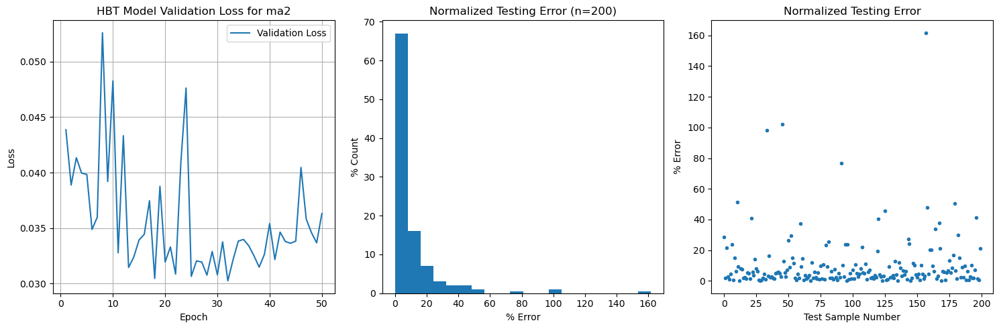

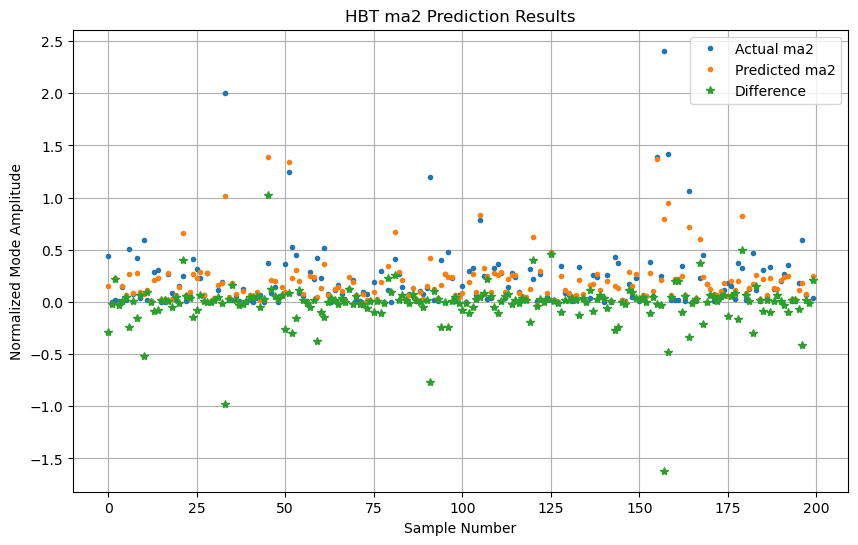

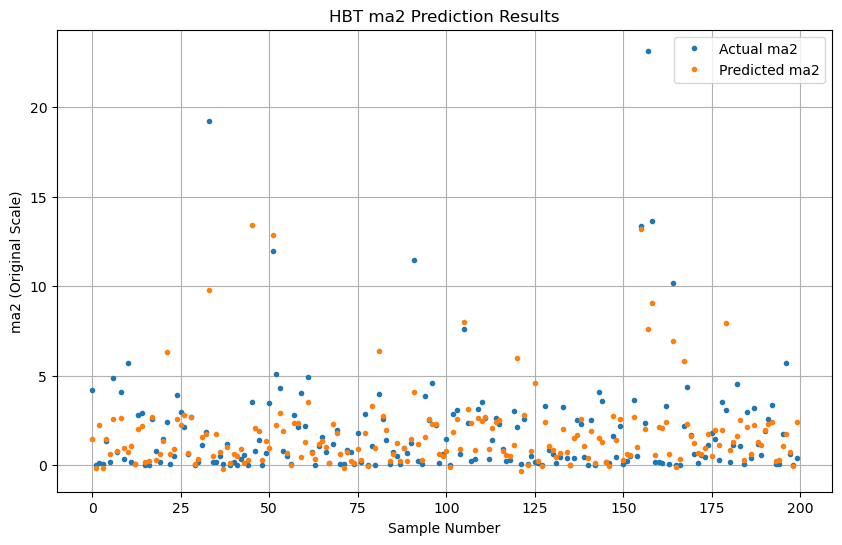

Maximum actual mode amplitude (normalized): 2.41
Maximum predicted mode amplitude (normalized): 1.39
Mean absolute percentage error: 10.45%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

9.619704036712632
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


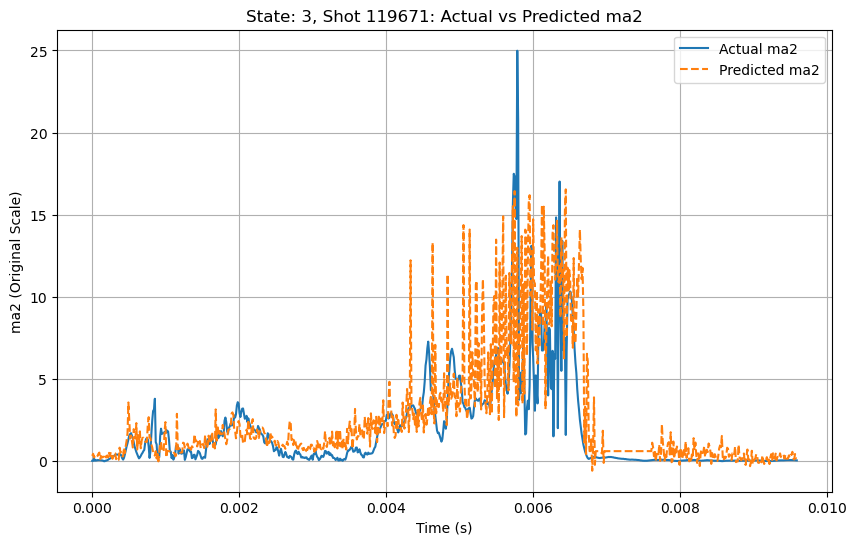

Shot 119671 - Mean absolute percentage error: 13.92%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 16.55


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
